# Classifying APS Failure Data using Tree-based Methods and SMOTE

## Tree-Based Methods

Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, roc_auc_score
import warnings
warnings.filterwarnings('ignore')

In [2]:
train_data_loc = '../data/aps_failure_training_set.csv'
test_data_loc = '../data/aps_failure_test_set.csv'
description_loc = '../data/aps_failure_description.txt'

### Download the APS Failure data

In [3]:
train_data = pd.read_csv(train_data_loc, na_values='na', skiprows=20)
test_data = pd.read_csv(test_data_loc, na_values='na', skiprows=20)

print('Shape of train data =', train_data.shape)
print('Shape of test data =', test_data.shape)

Shape of train data = (60000, 171)
Shape of test data = (16000, 171)


In [4]:
train_data.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


In [5]:
test_data.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0.0,20.0,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,neg,82,0.0,68.0,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,neg,66002,2.0,212.0,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,neg,59816,NaN,1010.0,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,neg,1814,NaN,156.0,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0


### Data Preparation

##### Checking the extent of missing values in each column of the training and test data

In [6]:
percent_missing = (train_data.isnull().sum() / len(train_data)) * 100
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print('Missing value percentage in train data:\n')
print(missing_value_df.to_string())

Missing value percentage in train data:

        percent_missing
br_000        82.106667
bq_000        81.203333
bp_000        79.566667
bo_000        77.221667
ab_000        77.215000
cr_000        77.215000
bn_000        73.348333
bm_000        65.915000
bl_000        45.461667
bk_000        38.390000
ch_000        24.768333
co_000        24.768333
cg_000        24.768333
cf_000        24.768333
ad_000        24.768333
ct_000        23.013333
cu_000        23.013333
cv_000        23.013333
cx_000        23.013333
cy_000        23.013333
cz_000        23.013333
da_000        23.013333
db_000        23.013333
dc_000        23.013333
ec_00         17.065000
cm_000        16.461667
ed_000        15.921667
cl_000        15.921667
ak_000         7.333333
ca_000         7.260000
dm_000         6.681667
dh_000         6.680000
dg_000         6.680000
df_000         6.680000
dl_000         6.680000
eb_000         6.678333
dk_000         6.678333
dj_000         6.678333
di_000         6.676667

In [7]:
percent_missing = (test_data.isnull().sum() / len(test_data)) * 100
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
print('Missing value percentage in test data:\n')
print(missing_value_df.to_string())

Missing value percentage in test data:

        percent_missing
br_000         82.05625
bq_000         81.13125
bp_000         79.50625
bo_000         77.35000
ab_000         77.26875
cr_000         77.26875
bn_000         73.20625
bm_000         65.91250
bl_000         45.16250
bk_000         38.08750
cf_000         24.88125
cg_000         24.88125
ch_000         24.88125
ad_000         24.88125
co_000         24.88125
cv_000         23.23750
cz_000         23.23750
cy_000         23.23750
da_000         23.23750
cx_000         23.23750
ct_000         23.23750
cu_000         23.23750
dc_000         23.23750
db_000         23.23750
ec_00          16.52500
cm_000         16.11250
cl_000         15.36875
ed_000         15.36875
ca_000          7.53750
ak_000          7.48750
dh_000          6.83750
dm_000          6.83750
eb_000          6.83750
dg_000          6.83750
df_000          6.83750
di_000          6.83750
dj_000          6.83750
dk_000          6.83750
dl_000          6.83750


This dataset has a ton of missing values as highlighted above hence discarding them is not a good idea as we risk losing a lot of valuable information. Scikit-learn provides a bunch of data imputation techniques in its official documentation online: https://scikit-learn.org/stable/modules/impute.html

The list of recommended techniques is collated below:

1. Univariate vs. Multivariate Imputation
2. Univariate feature imputation
3. Multivariate feature imputation
4. Nearest neighbors imputation
5. Keeping the number of features constants
6. Marking imputed values
7. Using estimators that handle NaN values

==> We are working with univariate data, and when it comes to handling missing values in this context, a common approach is to employ statistical measures like the mean or median. In this instance, I will utilize the mean to impute the missing values.

#### Calculate the coefficient of variation

In [8]:
TrX, TrY = train_data.iloc[:, 1:], train_data.iloc[:, 0]
TeX, TeY = test_data.iloc[:, 1:], test_data.iloc[:, 0]

In [9]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_TrX = imp.fit_transform(TrX)
imp_TeX = imp.fit_transform(TeX)
imp_TrX = pd.DataFrame(imp_TrX, columns=TrX.columns)
imp_TeX = pd.DataFrame(imp_TeX, columns=TeX.columns)

In [10]:
imp_TrX

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.713189,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.713189,0.000000e+00,190620.639314,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.713189,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.000000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.713189,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002.0,0.713189,6.640000e+02,186.000000,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286.0,0.713189,2.130707e+09,224.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112.0,0.000000,2.130706e+09,18.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292.0,0.713189,2.130706e+09,494.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [11]:
imp_TeX

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60.0,0.000000,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,2682.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,82.0,0.000000,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,66002.0,2.000000,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,199486.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,59816.0,0.772065,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,1814.0,0.772065,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,81852.0,0.772065,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,18.0,0.000000,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,79636.0,0.772065,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,110.0,0.772065,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [12]:
cv_res = {}
for column in imp_TrX.columns:
    s = imp_TrX[column].std()
    m = imp_TrX[column].mean()
    cv = s / m
    cv_res[column] = [s, m, cv]

cv_res_df = pd.DataFrame(cv_res, index=['std', 'mean', 'cv'])
cv_res_df = cv_res_df.T
print('Coefficient of variation for each column:\n')
print(cv_res_df.to_string())

Coefficient of variation for each column:

                 std          mean          cv
aa_000  1.454301e+05  5.933650e+04    2.450938
ab_000  1.660588e+00  7.131885e-01    2.328400
ac_000  7.724678e+08  3.560143e+08    2.169767
ad_000  3.504515e+07  1.906206e+05  183.847620
ae_000  1.581420e+02  6.819130e+00   23.190937
af_000  2.053753e+02  1.100682e+01   18.658921
ag_000  2.036363e+04  2.216364e+02   91.878565
ag_001  3.400875e+04  9.757223e+02   34.854950
ag_002  1.494791e+05  8.606015e+03   17.369143
ag_003  7.574598e+05  8.859128e+04    8.550049
ag_004  2.360968e+06  4.370966e+05    5.401479
ag_005  3.244312e+06  1.108374e+06    2.927092
ag_006  3.887462e+06  1.657818e+06    2.344927
ag_007  1.414786e+06  4.993098e+05    2.833484
ag_008  2.189178e+05  3.556989e+04    6.154583
ag_009  1.687068e+05  5.114753e+03   32.984351
ah_000  4.163181e+06  1.809931e+06    2.300187
ai_000  1.624197e+05  9.016965e+03   18.012682
aj_000  5.009504e+04  1.143675e+03   43.801822
ak_000  7.299814e

#### Correlation matrix

In [13]:
corr_matrix = imp_TrX.corr()
corr_matrix.style.background_gradient()

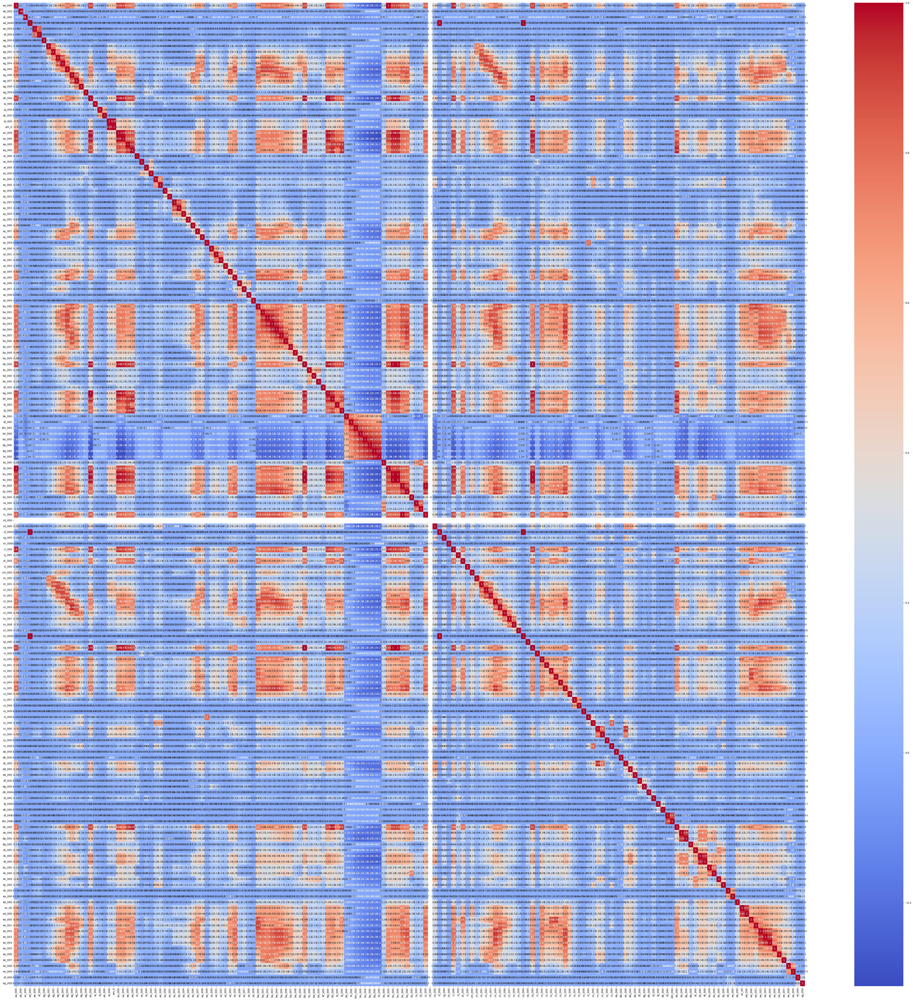

In [14]:
plt.figure(figsize=(70, 70))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

#### Scatter and Box Plots

In [15]:
cv_res_df = cv_res_df.T
sort_idx = np.argsort(cv_res_df.iloc[2])[::-1]
num_sel_cols = math.floor(math.sqrt(170))
sel_cols = cv_res_df.columns[sort_idx[:num_sel_cols]]
print('Selected Columns:\n')
print(cv_res_df[sel_cols][2:].T)

Selected Columns:

                cv
cs_009  235.277605
cf_000  184.233092
co_000  183.949017
ad_000  183.847620
dh_000  114.984991
dj_000  109.647285
ag_000   91.878565
as_000   86.416904
ay_009   83.786063
az_009   76.967978
ak_000   74.526688
au_000   68.160554
ch_000   58.268229


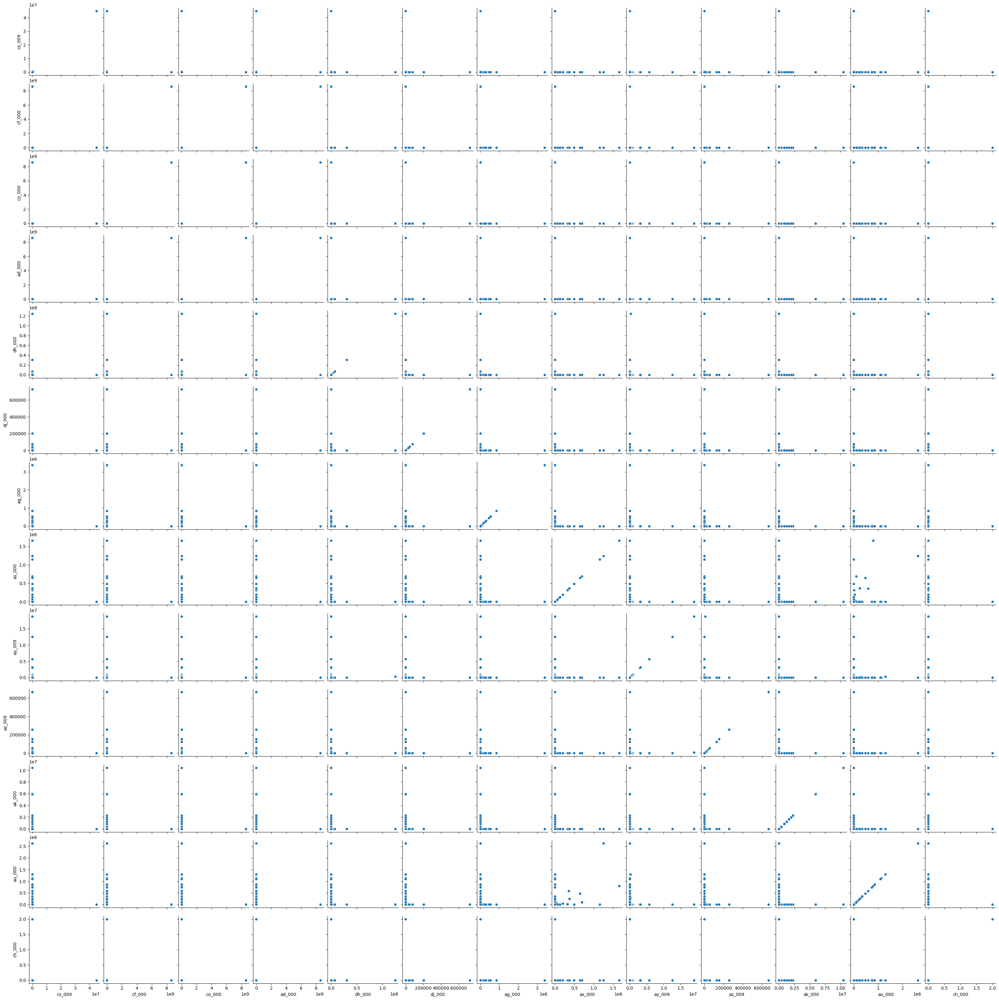

In [16]:
sns.pairplot(imp_TrX[sel_cols], diag_kind=None)

[None]

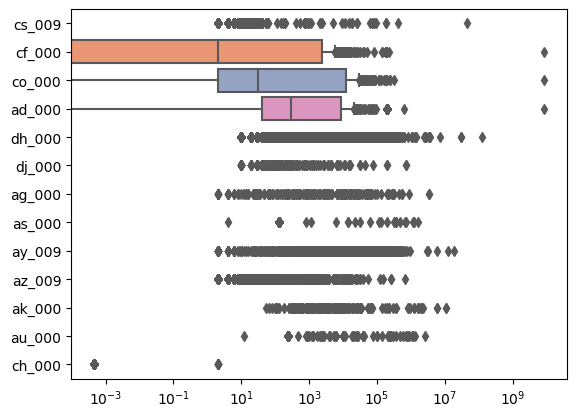

In [17]:
boxplot = sns.boxplot(data=imp_TrX[sel_cols], orient="h", palette="Set2")
boxplot.set(xscale="log")

Inference: The scatterplots display a high degree of dispersion, and it appears that relying solely on the scatterplot for drawing conclusions may not be feasible. Given that the imputation method employed is based on the mean, any outlier has the potential to substantially impact the data point.

#### Data set imbalanced?

In [18]:
print('No. of positive and negative labels in train data:')
print(TrY.value_counts())
print('\nNo. of positive and negative labels in test data:')
print(TeY.value_counts())

No. of positive and negative labels in train data:
neg    59000
pos     1000
Name: class, dtype: int64

No. of positive and negative labels in test data:
neg    15625
pos      375
Name: class, dtype: int64


==> By taking a look at the number of positive and negative labels in the training and test data, we can clearly say that the dataset is imbalanced.

### Training a random forest

Summary of the model run on train data:

Accuracy = 0.9920333333333333
Error = 0.007966666666666677
Confusion Matrix:
 [[58972    28]
 [  450   550]]


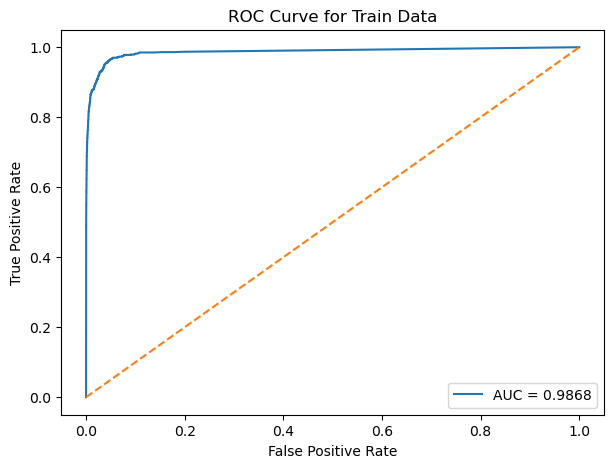

In [19]:
model = RandomForestClassifier(max_depth = 5, random_state = 60000, oob_score = True)
model.fit(imp_TrX, TrY)
pred_y_train = model.predict(imp_TrX)
pred_y_train_prob = model.predict_proba(imp_TrX)
print("Summary of the model run on train data:\n")
print('Accuracy =', accuracy_score(TrY, pred_y_train))
print('Error =', 1 - accuracy_score(TrY, pred_y_train))
print('Confusion Matrix:\n', confusion_matrix(TrY, pred_y_train))
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Train Data')
ypr = pred_y_train_prob[:, 1]
fpr, tpr, _ = roc_curve(TrY, ypr, pos_label='pos')
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

Summary of the model run on test data:

Accuracy = 0.9879375
Error = 0.012062499999999976
Train OOB Error = 0.009366666666666634
Confusion Matrix:
 [[15612    13]
 [  180   195]]


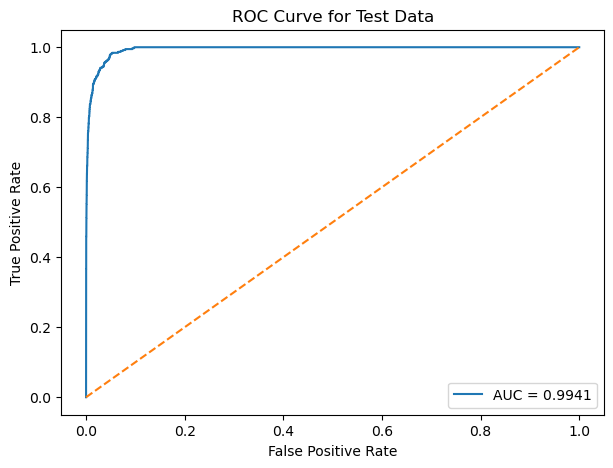

In [20]:
pred_y_test = model.predict(imp_TeX)
pred_y_test_prob = model.predict_proba(imp_TeX)
print("Summary of the model run on test data:\n")
print('Accuracy =', accuracy_score(TeY, pred_y_test))
print('Error =', 1 - accuracy_score(TeY, pred_y_test))
print('Train OOB Error =', 1 - model.oob_score_)
print('Confusion Matrix:\n', confusion_matrix(TeY, pred_y_test))
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Test Data')
ypr = pred_y_test_prob[:, 1]
fpr, tpr, _ = roc_curve(TeY, ypr, pos_label='pos')
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

==> Due to the limited number of positive class training examples, the model predominantly focuses on learning the negative classes, leading to a lack of comprehension regarding the positive classes. As a consequence, the test confusion matrix exhibits elevated false negatives, resulting in a higher overall testing error when compared to the training error, even with 60,000 data points and 59,500 accurate predictions.

### Class imbalance in random forest

I came across two methods to address class imbalance in random forest:

1. The BalancedRandomForestClassifier is an instance of a random forest classifier designed to achieve balance within its bootstrap samples by performing random under-sampling.

2. RandomForestClassifier with the parameter `class_weight='balanced'` involves assigning weights to classes, typically in the format {class_label: weight}, with a default weight of one for all classes. For multi-output tasks, you can supply a list of dictionaries corresponding to the columns of the target variable y.

I'll be opting for the second method.

Summary of the model run on train data:

Accuracy = 0.9588666666666666
Error = 0.041133333333333355
Confusion Matrix:
 [[56563  2437]
 [   31   969]]


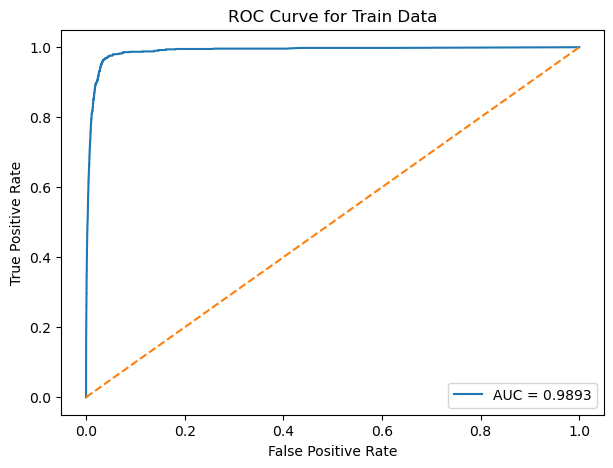

In [21]:
model = RandomForestClassifier(max_depth = 5, random_state = 60000, class_weight='balanced', oob_score = True)
model.fit(imp_TrX, TrY)
pred_y_train = model.predict(imp_TrX)
pred_y_train_prob = model.predict_proba(imp_TrX)
print("Summary of the model run on train data:\n")
print('Accuracy =', accuracy_score(TrY, pred_y_train))
print('Error =', 1 - accuracy_score(TrY, pred_y_train))
print('Confusion Matrix:\n', confusion_matrix(TrY, pred_y_train))
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Train Data')
ypr = pred_y_train_prob[:, 1]
fpr, tpr, _ = roc_curve(TrY, ypr, pos_label='pos')
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

Summary of the model run on test data:

Accuracy = 0.9595
Error = 0.04049999999999998
Train OOB Error = 0.04244999999999999
Confusion Matrix:
 [[14992   633]
 [   15   360]]


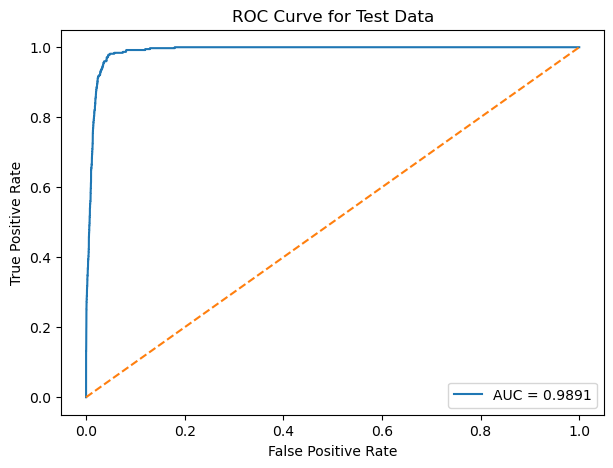

In [22]:
pred_y_test = model.predict(imp_TeX)
pred_y_test_prob = model.predict_proba(imp_TeX)
print("Summary of the model run on test data:\n")
print('Accuracy =', accuracy_score(TeY, pred_y_test))
print('Error =', 1 - accuracy_score(TeY, pred_y_test))
print('Train OOB Error =', 1 - model.oob_score_)
print('Confusion Matrix:\n', confusion_matrix(TeY, pred_y_test))
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Test Data')
ypr = pred_y_test_prob[:, 1]
fpr, tpr, _ = roc_curve(TeY, ypr, pos_label='pos')
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

==> Comparing results: The dataset exhibits an imbalance in the data distribution, causing the model in 1c to incline toward classifying samples as 'negative' ('neg') to achieve higher accuracy. This explains the observed superior performance in cases without compensation. A closer examination of the confusion matrix reveals that when class weights are balanced, the model in 1d significantly improves its predictions for the 'positive' class ('pos'). To provide context, the data from the confusion matrices indicates a notable difference in performance, with figures of 195/375 versus 360/375.

### XGBoost and Model Trees

In [23]:
params_grid = {'reg_alpha': [0.01, 0.05, 0.07, 0.08, 0.1, 0.2]}
scaler = StandardScaler()
scaled_TrX_df = pd.DataFrame(scaler.fit_transform(imp_TrX), columns=imp_TrX.columns)
scaled_TeX_df = pd.DataFrame(scaler.fit_transform(imp_TeX), columns=imp_TeX.columns)
TrY = pd.DataFrame(TrY)
TeY = pd.DataFrame(TeY)
TrY['class'].replace({'neg': 0, 'pos': 1}, inplace=True)
TeY['class'].replace({'neg': 0, 'pos': 1}, inplace=True)
stats_df = pd.DataFrame(np.nan, columns=['Train Accuracy', 'Test Accuracy', 'Train Error', 'Test Error', 'Train ROC', 'Test ROC'], index = ['Without SMOTE', 'With SMOTE'])

In [24]:
model = XGBClassifier(max_depth=5, learning_rate=0.1, objective='binary:logistic', colsample_bytree=0.3)
grid_search_cv = GridSearchCV(model, params_grid, scoring='accuracy', cv=KFold(n_splits=5, shuffle=True, random_state=69), n_jobs=-1)
grid_search_cv.fit(scaled_TrX_df, TrY)
opt_alpha = grid_search_cv.best_params_['reg_alpha']
print('Best alpha =', opt_alpha)
print('Best CV Train Accuracy =', grid_search_cv.best_score_)

Best alpha = 0.01
Best CV Train Accuracy = 0.9943166666666666


Summary of the model run on train data:

Accuracy = 0.9982
Error = 0.0018000000000000238
Confusion Matrix:
 [[58994     6]
 [  102   898]]
ROC AUC Score = 0.9489491525423729


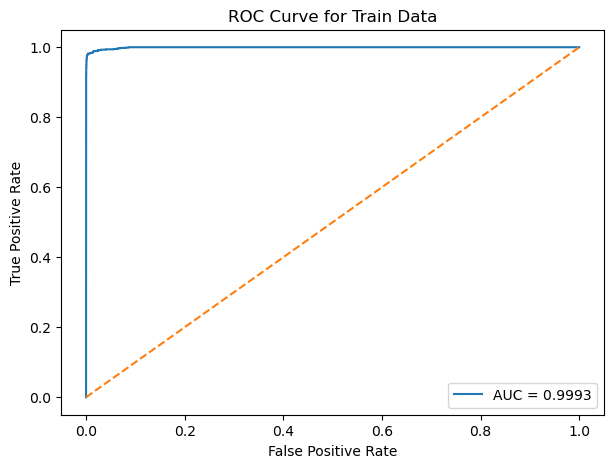

In [25]:
model = XGBClassifier(max_depth=5, learning_rate=0.1, objective='binary:logistic', colsample_bytree=0.3, reg_alpha=opt_alpha)
model.fit(scaled_TrX_df, TrY)
pred_y_train = model.predict(scaled_TrX_df)
pred_y_train_prob = model.predict_proba(scaled_TrX_df)
print("Summary of the model run on train data:\n")
print('Accuracy =', accuracy_score(TrY, pred_y_train))
print('Error =', 1 - accuracy_score(TrY, pred_y_train))
print('Confusion Matrix:\n', confusion_matrix(TrY, pred_y_train))
print('ROC AUC Score =', roc_auc_score(TrY, pred_y_train))
stats_df.loc['Without SMOTE', 'Train Accuracy'] = accuracy_score(TrY, pred_y_train)
stats_df.loc['Without SMOTE', 'Train Error'] = 1 - accuracy_score(TrY, pred_y_train)
stats_df.loc['Without SMOTE', 'Train ROC'] = roc_auc_score(TrY, pred_y_train)
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Train Data')
ypr = pred_y_train_prob[:, 1]
fpr, tpr, _ = roc_curve(TrY, ypr)
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

Summary of the model run on test data:

Accuracy = 0.992375
Error = 0.007624999999999993
Confusion Matrix:
 [[15601    24]
 [   98   277]]
ROC AUC Score = 0.8685653333333334


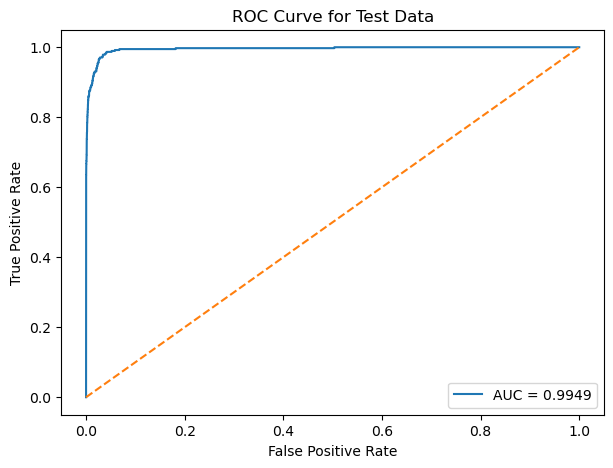

In [26]:
pred_y_test = model.predict(scaled_TeX_df)
pred_y_test_prob = model.predict_proba(scaled_TeX_df)
print("Summary of the model run on test data:\n")
print('Accuracy =', accuracy_score(TeY, pred_y_test))
print('Error =', 1 - accuracy_score(TeY, pred_y_test))
print('Confusion Matrix:\n', confusion_matrix(TeY, pred_y_test))
print('ROC AUC Score =', roc_auc_score(TeY, pred_y_test))
stats_df.loc['Without SMOTE', 'Test Accuracy'] = accuracy_score(TeY, pred_y_test)
stats_df.loc['Without SMOTE', 'Test Error'] = 1 - accuracy_score(TeY, pred_y_test)
stats_df.loc['Without SMOTE', 'Test ROC'] = roc_auc_score(TeY, pred_y_test)
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Test Data')
ypr = pred_y_test_prob[:, 1]
fpr, tpr, _ = roc_curve(TeY, ypr)
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

### Using SMOTE to pre-process the data

In [27]:
smote = SMOTE()
smote_TrX, smote_TrY = smote.fit_resample(scaled_TrX_df, TrY)
print('No. of positive and negative labels in train data before SMOTE:')
print(TrY.value_counts())
print('\nNo. of positive and negative labels in train data after SMOTE:')
print(smote_TrY.value_counts())

No. of positive and negative labels in train data before SMOTE:
class
0        59000
1         1000
dtype: int64

No. of positive and negative labels in train data after SMOTE:
class
0        59000
1        59000
dtype: int64


In [28]:
model = XGBClassifier(max_depth=5, learning_rate=0.1, objective='binary:logistic', colsample_bytree=0.3)
grid_search_cv = GridSearchCV(model, params_grid, scoring='accuracy', cv=KFold(n_splits=5, shuffle=True, random_state=69), n_jobs=-1)
grid_search_cv.fit(smote_TrX, smote_TrY)
opt_alpha = grid_search_cv.best_params_['reg_alpha']
print('Best alpha =', opt_alpha)
print('Best CV Train Accuracy =', grid_search_cv.best_score_)

Best alpha = 0.05
Best CV Train Accuracy = 0.9941525423728812


Summary of the model run on train data:

Accuracy = 0.9962542372881356
Error = 0.003745762711864442
Confusion Matrix:
 [[58626   374]
 [   68 58932]]
ROC AUC Score = 0.9962542372881356


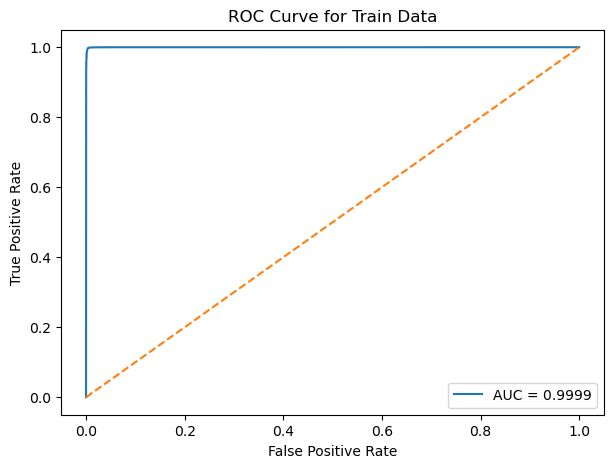

In [29]:
model = XGBClassifier(max_depth=5, learning_rate=0.1, objective='binary:logistic', colsample_bytree=0.3, reg_alpha=opt_alpha)
model.fit(smote_TrX, smote_TrY)
pred_y_train = model.predict(smote_TrX)
pred_y_train_prob = model.predict_proba(smote_TrX)
print("Summary of the model run on train data:\n")
print('Accuracy =', accuracy_score(smote_TrY, pred_y_train))
print('Error =', 1 - accuracy_score(smote_TrY, pred_y_train))
print('Confusion Matrix:\n', confusion_matrix(smote_TrY, pred_y_train))
print('ROC AUC Score =', roc_auc_score(smote_TrY, pred_y_train))
stats_df.loc['With SMOTE', 'Train Accuracy'] = accuracy_score(smote_TrY, pred_y_train)
stats_df.loc['With SMOTE', 'Train Error'] = 1 - accuracy_score(smote_TrY, pred_y_train)
stats_df.loc['With SMOTE', 'Train ROC'] = roc_auc_score(smote_TrY, pred_y_train)
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Train Data')
ypr = pred_y_train_prob[:, 1]
fpr, tpr, _ = roc_curve(smote_TrY, ypr)
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

Summary of the model run on test data:

Accuracy = 0.8505625
Error = 0.1494375
Confusion Matrix:
 [[13236  2389]
 [    2   373]]
ROC AUC Score = 0.9208853333333333


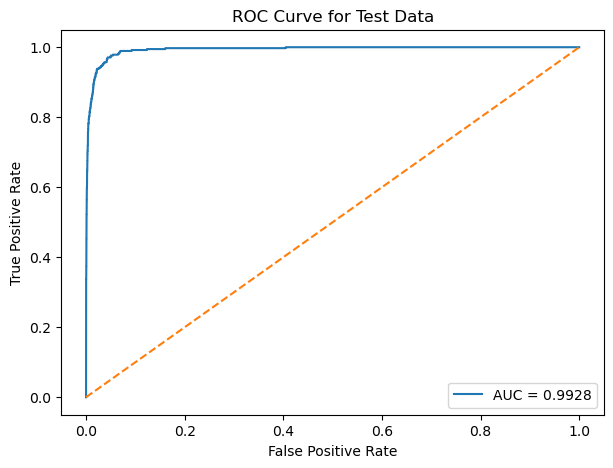

In [30]:
pred_y_test = model.predict(scaled_TeX_df)
pred_y_test_prob = model.predict_proba(scaled_TeX_df)
print("Summary of the model run on test data:\n")
print('Accuracy =', accuracy_score(TeY, pred_y_test))
print('Error =', 1 - accuracy_score(TeY, pred_y_test))
print('Confusion Matrix:\n', confusion_matrix(TeY, pred_y_test))
print('ROC AUC Score =', roc_auc_score(TeY, pred_y_test))
stats_df.loc['With SMOTE', 'Test Accuracy'] = accuracy_score(TeY, pred_y_test)
stats_df.loc['With SMOTE', 'Test Error'] = 1 - accuracy_score(TeY, pred_y_test)
stats_df.loc['With SMOTE', 'Test ROC'] = roc_auc_score(TeY, pred_y_test)
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('ROC Curve for Test Data')
ypr = pred_y_test_prob[:, 1]
fpr, tpr, _ = roc_curve(TeY, ypr)
roc_auc = auc(fpr, tpr)
ax.plot(fpr, tpr, label='AUC = %0.4f' % roc_auc)
ax.plot([0, 1], [0, 1], '--')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend(loc='lower right')
plt.show()

In [31]:
print('Stats for models run without and with SMOTE:')
stats_df

Stats for models run without and with SMOTE:


,Train Accuracy,Test Accuracy,Train Error,Test Error,Train ROC,Test ROC
Without SMOTE,0.998200,0.992375,0.001800,0.007625,0.948949,0.868565
With SMOTE,0.996254,0.850562,0.003746,0.149438,0.996254,0.920885
